# Four-Body Weber Electrodynamics (Singular Encounter Demo)

Aggressive 4-body demonstration in an intentionally close-encounter regime with **broken symmetry** so trajectories are curved/orbital instead of axis-locked lines.

- **Run A**: Cartesian integration only (`regularization_enabled=false`)
- **Run B**: Regularized integration (`regularization_enabled=true`)

This setup is selected to be near-singular and exploratory. We expect extreme close approaches and compare robustness/diagnostics between baseline and regularized evolution.


In [52]:
using WeberElectrodynamics
using LinearAlgebra
using Plots
using Printf


## 1. System Construction


In [53]:
# Physical parameters
n_particles = 4
dims = 2
masses = ones(4)
charges = [sqrt(0.1), sqrt(0.1), -sqrt(0.1), -sqrt(0.1)]
c = 4.0

system = WeberSystem(n_particles, dims)

println("Particles: ", system.n_particles)
println("Dimensions: ", system.dims)
println("Degrees of freedom: ", system.degrees_of_freedom)
println("Charges: ", charges)


Particles: 4
Dimensions: 2
Degrees of freedom: 8
Charges: [0.31622776601683794, 0.31622776601683794, -0.31622776601683794, -0.31622776601683794]


## 2. Symbolic Hamiltonian


In [54]:
system.hamiltonian_symbolic


(q1*q3*(1 + (-((((x1 - x3)*(px1 / m1 + (-px3) / m3) + (y1 - y3)*((-py3) / m3 + py1 / m1)) / sqrt((x1 - x3)^2 + (y1 - y3)^2))^2)) / (2(c^2)))) / sqrt((x1 - x3)^2 + (y1 - y3)^2) + (q1*q2*(1 + (-((((x1 - x2)*((-px2) / m2 + px1 / m1) + (y1 - y2)*(py1 / m1 + (-py2) / m2)) / sqrt((x1 - x2)^2 + (y1 - y2)^2))^2)) / (2(c^2)))) / sqrt((x1 - x2)^2 + (y1 - y2)^2) + (q2*q3*(1 + (-((((x2 - x3)*(px2 / m2 + (-px3) / m3) + (y2 - y3)*((-py3) / m3 + py2 / m2)) / sqrt((x2 - x3)^2 + (y2 - y3)^2))^2)) / (2(c^2)))) / sqrt((x2 - x3)^2 + (y2 - y3)^2) + (q2*q4*(1 + (-((((x2 - x4)*(px2 / m2 + (-px4) / m4) + (y2 - y4)*((-py4) / m4 + py2 / m2)) / sqrt((x2 - x4)^2 + (y2 - y4)^2))^2)) / (2(c^2)))) / sqrt((x2 - x4)^2 + (y2 - y4)^2) + (px3^2 + py3^2) / (2m3) + (q1*q4*(1 + (-((((x1 - x4)*(px1 / m1 + (-px4) / m4) + (y1 - y4)*(py1 / m1 + (-py4) / m4)) / sqrt((x1 - x4)^2 + (y1 - y4)^2))^2)) / (2(c^2)))) / sqrt((x1 - x4)^2 + (y1 - y4)^2) + (q3*q4*(1 + (-((((x3 - x4)*(px3 / m3 + (-px4) / m4) + (y3 - y4)*((-py4) / m4 + py3 /

## 3. Initial Condition, Symmetry Breaking, and Energy Balance

We use a cross geometry with **inward + tangential** momenta and a small positional perturbation to avoid purely straight symmetry-constrained trajectories.

$$
q_1=(-a,0),\quad q_2=(a,0),\quad q_3=(0,-a),\quad q_4=(0,a)
$$

$$
p_i = v_{\mathrm{in}}\,\hat r_{i,\mathrm{in}} + v_t\,\hat r_{i,\mathrm{tan}}
$$

with a small perturbation in `q0` to break exact axis invariance.

Initial energy split:

$$
H_0 = K_0 + U_0,
\qquad
\eta = \frac{K_0}{|U_0|}
$$

with $\eta \approx 1$ indicating comparable kinetic and potential scales.


In [55]:
# Locked aggressive scenario with swirl + symmetry break
a = 0.68
v_in = 0.30
v_t = 0.10

# Positions: left, right, bottom, top
q0 = [-a, 0.0,
       a, 0.0,
       0.0, -a,
       0.0,  a]

# Inward radial directions for each particle
r_in = [1.0, 0.0,
       -1.0, 0.0,
        0.0, 1.0,
        0.0,-1.0]

# Clockwise tangential directions around origin
r_tan = [0.0,-1.0,
         0.0, 1.0,
         1.0, 0.0,
        -1.0, 0.0]

p0 = [v_in * r_in[k] + v_t * r_tan[k] for k in 1:8]

# Small perturbation to break exact axis-locking symmetry
q0[1] += 0.03
q0[8] -= 0.02

tspan = (0.0, 10.0)
dt = 0.001

function kinetic_energy(p::Vector{Float64}, masses::Vector{Float64}, dims::Int)
    K = 0.0
    @inbounds for i = 1:length(masses)
        start = (i - 1) * dims
        psq = 0.0
        for d = 1:dims
            psq += p[start + d]^2
        end
        K += psq / (2 * masses[i])
    end
    return K
end

P_total = [sum(p0[1:2:end]), sum(p0[2:2:end])]
Lz = sum(q0[1:2:end] .* p0[2:2:end] .- q0[2:2:end] .* p0[1:2:end])

K0 = kinetic_energy(p0, masses, dims)
H0 = system.hamiltonian_compiled(q0, p0, vcat(masses, charges, [c]))
U0 = H0 - K0
eta = K0 / abs(U0)

println("a = ", a, ", v_in = ", v_in, ", v_t = ", v_t)
println("tspan = ", tspan, ", dt = ", dt)
@printf("K0 = %.6e\n", K0)
@printf("U0 = %.6e\n", U0)
@printf("H0 = %.6e\n", H0)
@printf("eta = K0/|U0| = %.3f\n", eta)
println("|P_total| = ", norm(P_total))
println("Lz = ", Lz)


a = 0.68, v_in = 0.3, v_t = 0.1
tspan = (0.0, 10.0), dt = 0.001
K0 = 2.000000e-01
U0 = -2.732571e-01
H0 = -7.325706e-02
eta = K0/|U0| = 0.732
|P_total| = 0.0
Lz = 0.267
, v_in = 0.3, v_t = 0.1
tspan = (0.0, 10.0), dt = 0.001
K0 = 2.000000e-01
U0 = -2.732571e-01
H0 = -7.325706e-02
eta = K0/|U0| = 0.732
|P_total| = 0.0
Lz = 0.267


## 4. Problem Setup (A/B)


In [56]:
prob_A = WeberProblem(system, tspan, q0, p0;
    masses=masses,
    charges=charges,
    c=c,
    dt=dt,
    regularization_enabled=false)

prob_B = WeberProblem(system, tspan, q0, p0;
    masses=masses,
    charges=charges,
    c=c,
    dt=dt,
    regularization_enabled=true,
    regularization_backend=:lifted_pair,
    regularization_r_on=0.45,
    regularization_r_off=0.65,
    regularization_max_substeps=512,
    regularization_chain_enabled=true,
    regularization_warn_on_fallback=false)


WeberProblem(WeberSystem(4 particles, 2D, 8 DOF), (0.0, 10.0), [-0.65, 0.0, 0.68, 0.0, 0.0, -0.68, 0.0, 0.66], [0.3, -0.1, -0.3, 0.1, 0.1, 0.3, -0.1, -0.3], [1.0, 1.0, 1.0, 1.0], [0.31622776601683794, 0.31622776601683794, -0.31622776601683794, -0.31622776601683794], 4.0, [1.0, 1.0, 1.0, 1.0, 0.31622776601683794, 0.31622776601683794, -0.31622776601683794, -0.31622776601683794, 4.0], 0.001, 1.0e-13, 100, RegularizationOptions(true, 0.45, 0.65, 0.15, 0.25, 512, 1.0e-12, 1.0e-12, true, :lifted_pair, false))

## 5. Integration


In [57]:
sol_A = solve(prob_A)
sol_B = solve(prob_B)

println("Run A retcode: ", sol_A.retcode)
println("Run B retcode: ", sol_B.retcode)
println("Run A points: ", length(sol_A.t), ", final t = ", sol_A.t[end])
println("Run B points: ", length(sol_B.t), ", final t = ", sol_B.t[end])

println("Run B regularization diagnostics:")
println("  pair steps: ", sol_B.regularization.pair_steps)
println("  chain steps: ", sol_B.regularization.chain_steps)
println("  max substeps used: ", sol_B.regularization.max_substeps_used)
println("  min encounter distance: ", @sprintf("%.6e", sol_B.regularization.min_encounter_distance))


Run A retcode: Failure
Run B retcode: Success
Run A points: 1691, final t = 1.6899999999999247
Run B points: 10001, final t = 10.0
Run B regularization diagnostics:
  pair steps: 7946
  chain steps: 1119
  max substeps used: 69
  min encounter distance: 9.921350e-03

Run B retcode: Success
Run A points: 1691, final t = 1.6899999999999247
Run B points: 10001, final t = 10.0
Run B regularization diagnostics:
  pair steps: 7946
  chain steps: 1119
  max substeps used: 69
  min encounter distance: 9.921350e-03


## 6. Encounter Helper (Minimum Pair Distance and Representative Pair)


In [58]:
function minimum_pair_info(sol::WeberSolution, n_particles::Int, dims::Int)
    min_r = Inf
    min_pair = (0, 0)
    min_t = NaN

    @inbounds for (t, q) in zip(sol.t, sol.q)
        for i = 1:n_particles
            si = (i - 1) * dims
            for j = (i + 1):n_particles
                sj = (j - 1) * dims
                r2 = 0.0
                for d = 1:dims
                    dq = q[si + d] - q[sj + d]
                    r2 += dq * dq
                end
                r = sqrt(r2)
                if r < min_r
                    min_r = r
                    min_pair = (i, j)
                    min_t = t
                end
            end
        end
    end

    return min_r, min_pair, min_t
end

min_sep_A, pair_A, tmin_A = minimum_pair_info(sol_A, n_particles, dims)
min_sep_B, pair_B, tmin_B = minimum_pair_info(sol_B, n_particles, dims)

selected_pair = pair_B
println("Run A min separation: ", @sprintf("%.6e", min_sep_A), " at t=", @sprintf("%.4f", tmin_A), " pair=", pair_A)
println("Run B min separation: ", @sprintf("%.6e", min_sep_B), " at t=", @sprintf("%.4f", tmin_B), " pair=", pair_B)
println("Selected representative pair for pair-based plots: ", selected_pair)


Run A min separation: 9.938232e-03 at t=1.6900 pair=(1, 3)
Run B min separation: 9.921350e-03 at t=2.6400 pair=(1, 3)
Selected representative pair for pair-based plots: (1, 3)


## 7. Trajectory Analysis


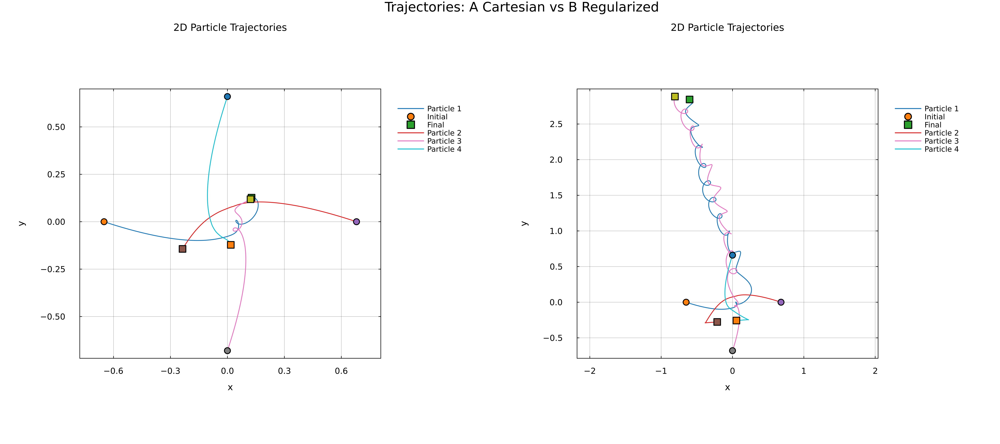

In [59]:
traj_A = compute_trajectory_data(sol_A, n_particles, dims; stride=1)
traj_B = compute_trajectory_data(sol_B, n_particles, dims; stride=1)

plot(
    plot_trajectories(traj_A),
    plot_trajectories(traj_B),
    layout=(1,2),
    size=(1800,800),
    plot_title="Trajectories: A Cartesian vs B Regularized",
)


## 8. Energy Analysis


In [60]:
energy_A = compute_energy_timeseries(sol_A; stride=1)
energy_B = compute_energy_timeseries(sol_B; stride=1)

println("Run A max global energy error (%): ", @sprintf("%.4e", energy_A.statistics.global_error_percent_max))
println("Run B max global energy error (%): ", @sprintf("%.4e", energy_B.statistics.global_error_percent_max))


Run A max global energy error (%): 2.6705e+02
Run B max global energy error (%): 5.9118e+03


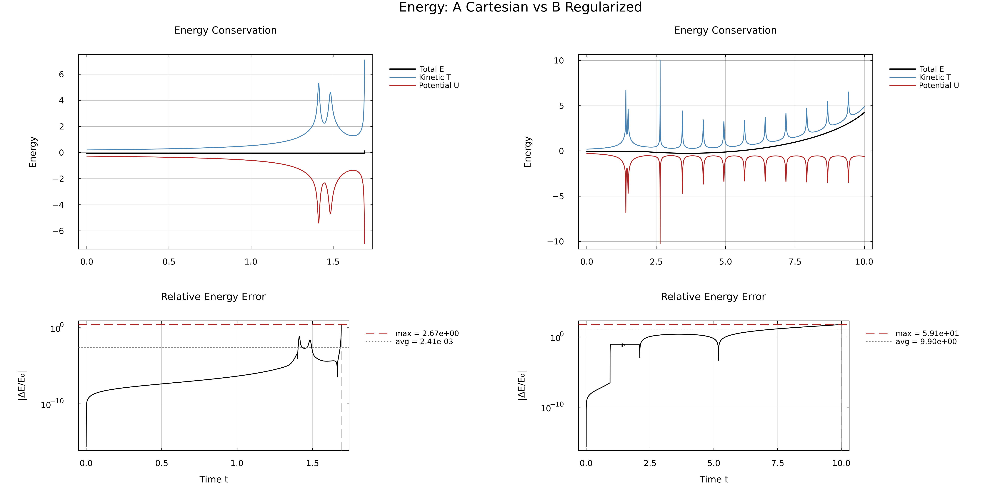

In [61]:
plot(
    plot_energy(energy_A),
    plot_energy(energy_B),
    layout=(1,2),
    size=(1800,900),
    plot_title="Energy: A Cartesian vs B Regularized",
)


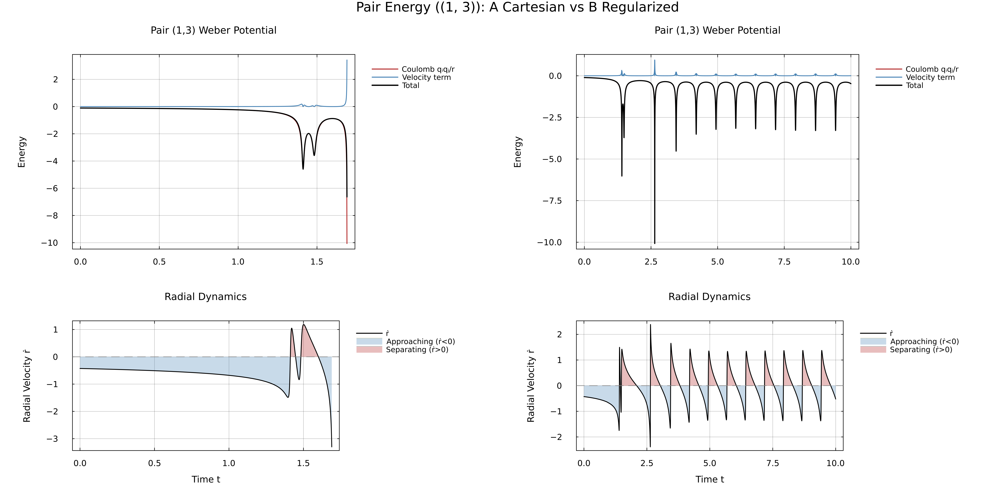

In [62]:
plot(
    plot_pair_energy(energy_A, selected_pair),
    plot_pair_energy(energy_B, selected_pair),
    layout=(1,2),
    size=(1800,900),
    plot_title="Pair Energy ($(selected_pair)): A Cartesian vs B Regularized",
)


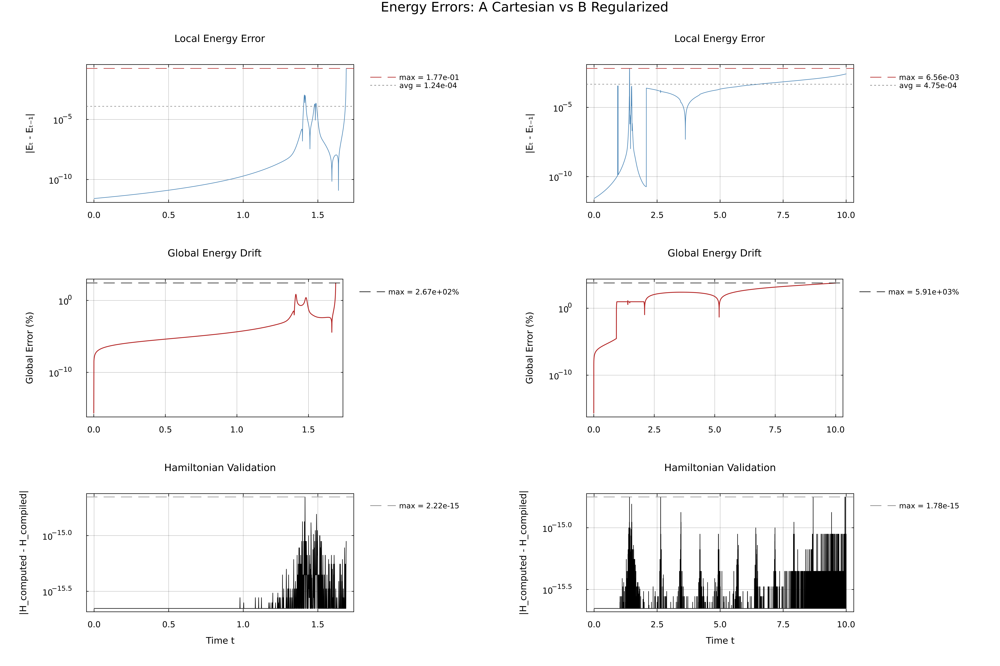

In [63]:
plot(
    plot_energy_errors(energy_A),
    plot_energy_errors(energy_B),
    layout=(1,2),
    size=(1800,1200),
    plot_title="Energy Errors: A Cartesian vs B Regularized",
)


## 9. Force Analysis (Representative Pair)


In [64]:
forces_A = compute_pair_force_timeseries(sol_A, selected_pair, n_particles, dims, masses, charges, c; stride=1)
forces_B = compute_pair_force_timeseries(sol_B, selected_pair, n_particles, dims, masses, charges, c; stride=1)

println("Selected pair: ", selected_pair)
println("Run A force mean: ", @sprintf("%.4e", forces_A.stats.mean))
println("Run B force mean: ", @sprintf("%.4e", forces_B.stats.mean))


Selected pair: (1, 3)
Run A force mean: 8.1137e+00
Run B force mean: 7.5751e+00


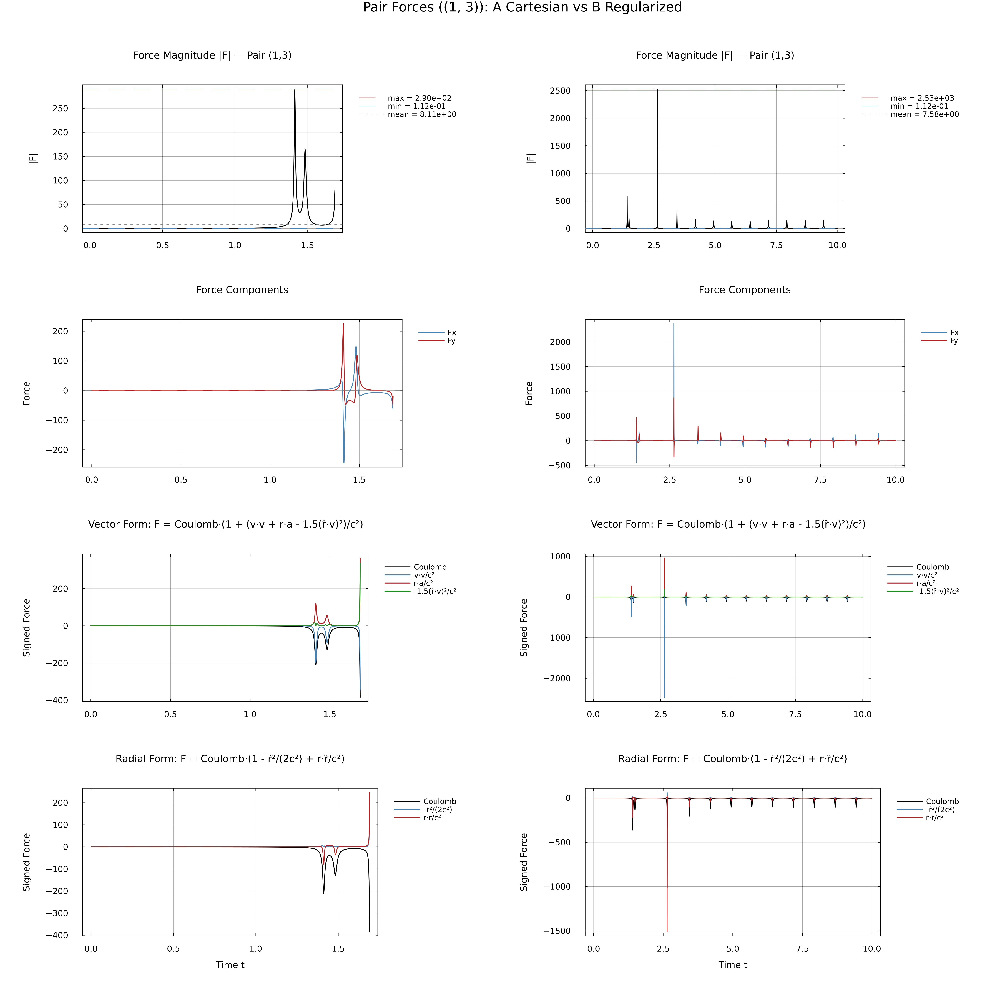

In [65]:
plot(
    plot_pair_forces(forces_A),
    plot_pair_forces(forces_B),
    layout=(1,2),
    size=(1800,1800),
    plot_title="Pair Forces ($(selected_pair)): A Cartesian vs B Regularized",
)


## 10. Phase Space


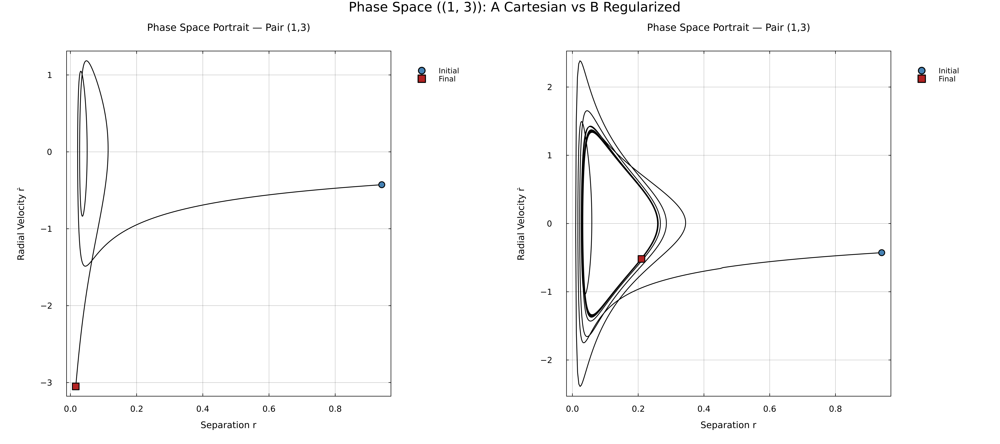

In [66]:
plot(
    plot_phase_space(forces_A),
    plot_phase_space(forces_B),
    layout=(1,2),
    size=(1800,800),
    plot_title="Phase Space ($(selected_pair)): A Cartesian vs B Regularized",
)


## 11. Momentum


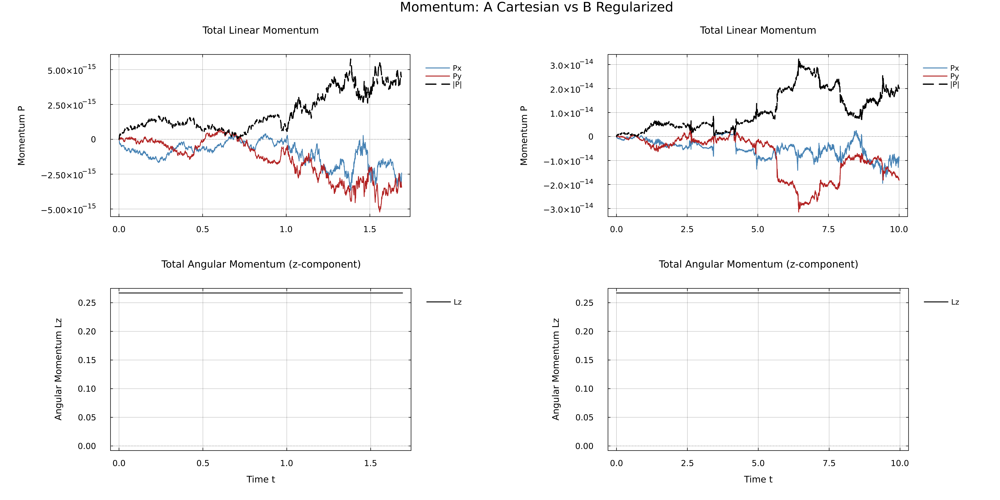

In [67]:
momentum_A = compute_momentum_timeseries(sol_A; stride=1)
momentum_B = compute_momentum_timeseries(sol_B; stride=1)

plot(
    plot_momentum(momentum_A),
    plot_momentum(momentum_B),
    layout=(1,2),
    size=(1800,900),
    plot_title="Momentum: A Cartesian vs B Regularized",
)


## 12. Comparison Summary


In [68]:
println("Retcodes and final time:")
println("  Run A: ", sol_A.retcode, ", final t = ", sol_A.t[end], ", points = ", length(sol_A.t))
println("  Run B: ", sol_B.retcode, ", final t = ", sol_B.t[end], ", points = ", length(sol_B.t))

println("\nMinimum separation:")
println("  Run A: ", @sprintf("%.6e", min_sep_A), " at t=", @sprintf("%.4f", tmin_A), " pair=", pair_A)
println("  Run B: ", @sprintf("%.6e", min_sep_B), " at t=", @sprintf("%.4f", tmin_B), " pair=", pair_B)

println("\nEnergy drift (% max global):")
println("  Run A: ", @sprintf("%.6e", energy_A.statistics.global_error_percent_max))
println("  Run B: ", @sprintf("%.6e", energy_B.statistics.global_error_percent_max))

println("\nRepresentative pair used for pair-based plots: ", selected_pair)

println("\nRun B regularization diagnostics:")
println("  requested backend: ", sol_B.regularization.requested_backend)
println("  used backend: ", sol_B.regularization.used_backend)
println("  pair steps: ", sol_B.regularization.pair_steps)
println("  adaptive pair steps: ", sol_B.regularization.adaptive_pair_steps)
println("  lifted pair steps: ", sol_B.regularization.lifted_pair_steps)
println("  chain steps: ", sol_B.regularization.chain_steps)
println("  max substeps used: ", sol_B.regularization.max_substeps_used)
println("  min encounter distance: ", @sprintf("%.6e", sol_B.regularization.min_encounter_distance))


Retcodes and final time:
  Run A: Failure, final t = 1.6899999999999247, points = 1691
  Run B: Success, final t = 10.0, points = 10001

Minimum separation:
  Run A: 9.938232e-03 at t=1.6900 pair=(1, 3)
  Run B: 9.921350e-03 at t=2.6400 pair=(1, 3)

Energy drift (% max global):
  Run A: 2.670458e+02
  Run B: 5.911784e+03

Representative pair used for pair-based plots: (1, 3)

Run B regularization diagnostics:
  requested backend: lifted_pair
  used backend: mixed
  pair steps: 7946
  adaptive pair steps: 0
  lifted pair steps: 7946
  chain steps: 1119
  max substeps used: 69
  min encounter distance: 9.921350e-03


## API Summary

| Category | Types | Functions |
|----------|-------|-----------|
| **System** | `WeberSystem` | - |
| **Problem** | `WeberProblem` | - |
| **Solution** | `WeberSolution`, `WeberIntegrator` | `solve`, `init`, `step!`, `solve!` |
| **Trajectories** | `TrajectoryData` | `compute_trajectory_data`, `plot_trajectories` |
| **Energy** | `EnergyData`, `PairEnergyData`, `EnergyStatistics` | `compute_energy_timeseries`, `plot_energy`, `plot_pair_energy`, `plot_energy_errors` |
| **Forces + Phase Space** | `PairForceData`, `ForceStatistics`, `PhaseSpaceData` | `compute_pair_force_timeseries`, `plot_pair_forces`, `plot_phase_space` |
| **Momentum** | `MomentumData` | `compute_momentum_timeseries`, `plot_momentum` |

This notebook focuses on 4-body near-singular encounter behavior with an aggressive setup and compares baseline Cartesian integration against regularized integration.
